# Object Detection using TLT YOLOv4

Transfer learning is the process of transferring learned features from one application to another. It is a commonly used training technique where you use a model trained on one task and re-train to use it on a different task. 

Transfer Learning Toolkit (TLT) is a simple and easy-to-use Python based AI toolkit for taking purpose-built AI models and customizing them with users' own data.

<img align="center" src="https://developer.nvidia.com/sites/default/files/akamai/embedded-transfer-learning-toolkit-software-stack-1200x670px.png" width="1080">


## Learning Objectives
In this notebook, you will learn how to leverage the simplicity and convenience of TLT to:

* Take a pretrained resnet18 model and train a ResNet-18 Yolo_v4 model on the KITTI dataset
* Prune the trained yolo_V4 model
* Retrain the pruned model to recover lost accuracy
* Export the pruned model
* Quantize the pruned model using QAT
* Run Inference on the trained model
* Export the pruned, quantized and retrained model to a .etlt file for deployment to DeepStream
* Run inference on the exported. etlt model to verify deployment using TensorRT

## Table of Contents

This notebook shows an example usecase of YOLO v4 object detection using Transfer Learning Toolkit.

0. [Set up env variables and map drives](#head-0)
1. [Install the TLT launcher](#head-1)
2. [Prepare dataset and pre-trained model](#head-2) <br>
     2.1 [Download the dataset](#head-2-1)<br>
     2.2 [Verify the downloaded dataset](#head-2-2)<br>
     2.3 [Download pretrained model](#head-2-3)
3. [Provide training specification](#head-3)
4. [Run TLT training](#head-4)
5. [Evaluate trained models](#head-5)
6. [Prune trained models](#head-6)
7. [Retrain pruned models](#head-7)
8. [Evaluate retrained model](#head-8)
9. [Visualize inferences](#head-9)
10. [Model Export](#head-10)
11. [Verify deployed model](#head-11)


## 0. Set up env variables and map drives <a class="anchor" id="head-0"></a>

When using the purpose-built pretrained models from NGC, please make sure to set the `$KEY` environment variable to the key as mentioned in the model overview. Failing to do so, can lead to errors when trying to load them as pretrained models.

The following notebook requires the user to set an env variable called the `$LOCAL_PROJECT_DIR` as the path to the users workspace. Please note that the dataset to run this notebook is expected to reside in the `$LOCAL_PROJECT_DIR/data`, while the TLT experiment generated collaterals will be output to `$LOCAL_PROJECT_DIR/yolo_v4`. More information on how to set up the dataset and the supported steps in the TLT workflow are provided in the subsequent cells.

*Note: Please make sure to remove any stray artifacts/files from the `$USER_EXPERIMENT_DIR` or `$DATA_DOWNLOAD_DIR` paths as mentioned below, that may have been generated from previous experiments. Having checkpoint files etc may interfere with creating a training graph for a new experiment.*

In [1]:
# Setting up env variables for cleaner command line commands.
import os

print("Please replace the variable with your key.")
%env KEY=nvidia_tlt
%env USER_EXPERIMENT_DIR=/workspace/tlt-experiments/yolo_v4_iguana
%env DATA_DOWNLOAD_DIR=/workspace/tlt-experiments/data/iguana_detection

# Set this path if you don't run the notebook from the samples directory.
# %env NOTEBOOK_ROOT=~/tlt-samples/yolo_v4

# Please define this local project directory that needs to be mapped to the TLT docker session.
# The dataset expected to be present in $LOCAL_PROJECT_DIR/data, while the results for the steps
# in this notebook will be stored at $LOCAL_PROJECT_DIR/detectnet_v2
%env LOCAL_PROJECT_DIR=/home/rt/Documents/nvidia/tlt-experiments
os.environ["LOCAL_DATA_DIR"] = os.path.join(os.getenv("LOCAL_PROJECT_DIR", os.getcwd()), "data/iguana_detection")
os.environ["LOCAL_EXPERIMENT_DIR"] = os.path.join(os.getenv("LOCAL_PROJECT_DIR", os.getcwd()), "yolo_v4_iguana")

# The sample spec files are present in the same path as the downloaded samples.
os.environ["LOCAL_SPECS_DIR"] = os.path.join(
    os.getenv("NOTEBOOK_ROOT", os.getcwd()),
    "specs"
)
%env SPECS_DIR=/workspace/tlt-experiments/yolo_v4_iguana/specs
# Showing list of specification files.
!ls -rlt $LOCAL_SPECS_DIR

Please replace the variable with your key.
env: KEY=nvidia_tlt
env: USER_EXPERIMENT_DIR=/workspace/tlt-experiments/yolo_v4_iguana
env: DATA_DOWNLOAD_DIR=/workspace/tlt-experiments/data/iguana_detection
env: LOCAL_PROJECT_DIR=/home/rt/Documents/nvidia/tlt-experiments
env: SPECS_DIR=/workspace/tlt-experiments/yolo_v4_iguana/specs
total 8
-rw-rw-r-- 1 rt rt 2141  六  16 21:59 yolo_v4_train_mobilenet_v2_kitti.txt
-rw-rw-r-- 1 rt rt 2110  六  16 22:26 yolo_v4_retrain_mobilenet_v2_kitti.txt


In [2]:
!echo $LOCAL_DATA_DIR
!echo $LOCAL_EXPERIMENT_DIR

/home/rt/Documents/nvidia/tlt-experiments/data/iguana_detection
/home/rt/Documents/nvidia/tlt-experiments/yolo_v4_iguana


The cell below maps the project directory on your local host to a workspace directory in the TLT docker instance, so that the data and the results are mapped from outside to inside of the docker instance.

In [3]:
# Mapping up the local directories to the TLT docker.
import json
mounts_file = os.path.expanduser("~/.tlt_mounts.json")

# Define the dictionary with the mapped drives
drive_map = {
    "Mounts": [
        # Mapping the data directory
        {
            "source": os.environ["LOCAL_PROJECT_DIR"],
            "destination": "/workspace/tlt-experiments"
        },
        # Mapping the specs directory.
        {
            "source": os.environ["LOCAL_SPECS_DIR"],
            "destination": os.environ["SPECS_DIR"]
        },
    ]
}

# Writing the mounts file.
with open(mounts_file, "w") as mfile:
    json.dump(drive_map, mfile, indent=4)

In [4]:
!cat ~/.tlt_mounts.json

{
    "Mounts": [
        {
            "source": "/home/rt/Documents/nvidia/tlt-experiments",
            "destination": "/workspace/tlt-experiments"
        },
        {
            "source": "/home/rt/Documents/nvidia/cv_samples_1.0.2/yolo_v4_iguana/specs",
            "destination": "/workspace/tlt-experiments/yolo_v4_iguana/specs"
        }
    ]
}

## 1. Install the TLT launcher <a class="anchor" id="head-1"></a>
The TLT launcher is a python package distributed as a python wheel listed in the `nvidia-pyindex` python index. You may install the launcher by executing the following cell.

Please note that TLT recommends users to run the TLT launcher in a virtual env with python 3.6.9. You may follow the instruction in this [page](https://virtualenvwrapper.readthedocs.io/en/latest/install.html) to set up a python virtual env using the `virtualenv` and `virtualenvwrapper` packages. Once you have setup virtualenvwrapper, please set the version of python to be used in the virtual env by using the `VIRTUALENVWRAPPER_PYTHON` variable. You may do so by running

```sh
export VIRTUALENVWRAPPER_PYTHON=/path/to/bin/python3.x
```
where x >= 6 and <= 8

We recommend performing this step first and then launching the notebook from the virtual environment. In addition to installing TLT python package, please make sure of the following software requirements:
* python >=3.6.9 < 3.8.x
* docker-ce > 19.03.5
* docker-API 1.40
* nvidia-container-toolkit > 1.3.0-1
* nvidia-container-runtime > 3.4.0-1
* nvidia-docker2 > 2.5.0-1
* nvidia-driver > 455+

Once you have installed the pre-requisites, please log in to the docker registry nvcr.io by following the command below

```sh
docker login nvcr.io
```

You will be trigerred to enter a username and password. The username is `$oauthtoken` and the password is the API key generated from `ngc.nvidia.com`. Please follow the instructions in the [NGC setup guide](https://docs.nvidia.com/ngc/ngc-overview/index.html#generating-api-key) to generate your own API key.

After setting up your virtual environment with the above requirements, install TLT pip package.

In [5]:
# SKIP this step IF you have already installed the tlt launcher.
!pip3 install nvidia-pyindex
!pip3 install nvidia-tlt

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [6]:
# View the versions of the TLT launcher
!tlt info

Configuration of the TLT Instance
dockers: ['nvcr.io/nvidia/tlt-streamanalytics', 'nvcr.io/nvidia/tlt-pytorch']
format_version: 1.0
tlt_version: 3.0
published_date: 02/02/2021


## 2. Prepare dataset and pre-trained model <a class="anchor" id="head-2"></a>

In [7]:
# verify
import os

DATA_DIR = os.environ.get('LOCAL_DATA_DIR')
num_training_images = len(os.listdir(os.path.join(DATA_DIR, "training/image_2")))
num_training_labels = len(os.listdir(os.path.join(DATA_DIR, "training/label_2")))
num_testing_images = len(os.listdir(os.path.join(DATA_DIR, "testing/image_2")))
print("Number of images in the train/val set. {}".format(num_training_images))
print("Number of labels in the train/val set. {}".format(num_training_labels))
print("Number of images in the test set. {}".format(num_testing_images))

Number of images in the train/val set. 4507
Number of labels in the train/val set. 4506
Number of images in the test set. 57


In [8]:
!pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


### Label formatting
- Convert yolo to kitti format
- If your label is already in kitti format, simply igone this cell.

In [9]:
# """
#  The code is used to convert yolo’s txt label format to kitti’s txt label format;
# """
# import os
# import cv2
# import time

# class_name = 'iguana'


# # Restore the coordinates in the txt to the coordinates of the original photo
# def restore_coordinate(yolo_bbox, image_w, image_h):
#     box_w = float(yolo_bbox[3]) * image_w
#     box_h = float(yolo_bbox[4]) * image_h
#     x_mid = float(yolo_bbox[1]) * image_w + 1
#     y_mid = float(yolo_bbox[2]) * image_h + 1
#     xmin = int(x_mid - box_w / 2)
#     xmax = int(x_mid + box_w / 2)
#     ymin = int(y_mid - box_h / 2) + 5 # Added an offset of 5;
#     ymax = int(y_mid + box_h / 2) + 5
#     return [xmin, ymin, xmax, ymax]


# # Generate txt tag file in kitti format
# def write_to_kitti_txt(save_path, box, name):
#     with open(os.path.join(save_path, name + '.txt'), 'w') as f:
#         # kitti tag file contains 15 parameters
#         new_info = class_name + ' ' + '0.00' + ' ' + '0' + ' ' + '0.00' + ' '\
#                    + str(box[0]) + ' ' + str(box[1]) + ' ' + str(box[2]) + ' ' + str(box[3]) \
#                    + ' ' + '0.00' + ' ' + '0.00' + ' ' + '0.00' + ' ' + '0.00' + ' ' + '0.00' \
#                    + ' ' + '0.00' + ' ' + '0.00'
#         f.writelines(new_info)
#     f.close()


# # Get the labels file and images file of the photo, and generate a new label file
# def restore_results(images_folder, labels_folder):
#     labels = os.listdir(labels_folder)
#     for label in labels:
#         name = label.split('.')[0]
#         print(name)
#         with open(os.path.join(labels_folder, label), 'r') as f:
#             info = f.readline().strip('\n')
#             label = list(info.split(' '))
#             img = cv2.imread(os.path.join(images_folder, name + '.png'))
#             w = img.shape[1]
#             h = img.shape[0]
#             ori_box = restore_coordinate(label, w, h)
#             write_to_kitti_txt('/home/rt/Documents/nvidia/tlt-experiments/data/iguana_detection/training/kitti_labels', ori_box, name)
#         f.close()

# restore_results('/home/rt/Documents/nvidia/tlt-experiments/data/iguana_detection/training/image_2',
#                 '/home/rt/Documents/nvidia/tlt-experiments/data/iguana_detection/training/label_2')

In [10]:
# Sample kitti label.
!cat $LOCAL_DATA_DIR/training/label_2/1453048262_0.txt

iguana 0.00 0 0.00 159 312 307 454 0.00 0.00 0.00 0.00 0.00 0.00 0.00

### Train / Val split

In [11]:
# Generate val dataset out of training dataset
!python3 ../ssd/generate_val_dataset.py --input_image_dir=$LOCAL_DATA_DIR/training/image_2 \
                                        --input_label_dir=$LOCAL_DATA_DIR/training/label_2 \
                                        --output_dir=$LOCAL_DATA_DIR/val

This script will not run as output image path already exists.


Additionally, if you have your own dataset already in a volume (or folder), you can mount the volume on `LOCAL_DATA_DIR` (or create a soft link). Below shows an example:
```bash
# if your dataset is in /dev/sdc1
mount /dev/sdc1 $LOCAL_DATA_DIR

# if your dataset is in folder /var/dataset
ln -sf /var/dataset $LOCAL_DATA_DIR
```

### Generate Anchor shapes

In [12]:
# If you use your own dataset, you will need to run the code below to generate the best anchor shape

!tlt yolo_v4 kmeans -l $DATA_DOWNLOAD_DIR/training/label_2 \
                    -i $DATA_DOWNLOAD_DIR//training/image_2 \
                    -n 9 \
                    -x 1248 \
                    -y 384

# The anchor shape generated by this script is sorted. Write the first 3 into small_anchor_shape in the config
# file. Write middle 3 into mid_anchor_shape. Write last 3 into big_anchor_shape.

2021-06-16 22:40:11,621 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the ~/.tlt_mounts.json file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Start optimization iteration: 1
Start optimization iteration: 11
Start optimization iteration: 21
Start optimization iteration: 31
Start optimization iteration: 41
Start optimization iteration: 51
Please use following anchor sizes in YOLO config:
(227.50, 35.62)
(322.29, 100.50)
(654.87, 62.62)
(563.06, 161.56)
(366.84, 255.25)
(884.81, 112.50)
(979.88, 197.24)
(695.09, 287.32)
(1038.38, 316.00)
2021-06-16 22:40:20,371 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


### 2.3 Download pre-trained model <a class="anchor" id="head-2-3"></a>

We will use NGC CLI to get the pre-trained models. For more details, go to [ngc.nvidia.com](ngc.nvidia.com) and click the SETUP on the navigation bar.

In [13]:
!ngc registry model list nvidia/tlt_pretrained_object_detection:*

+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| Versi | Accur | Epoch | Batch | GPU   | Memor | File  | Statu | Creat |
| on    | acy   | s     | Size  | Model | y Foo | Size  | s     | ed    |
|       |       |       |       |       | tprin |       |       | Date  |
|       |       |       |       |       | t     |       |       |       |
+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| vgg19 | 77.56 | 80    | 1     | V100  | 153.7 | 153.7 | UPLOA | Apr   |
|       |       |       |       |       |       | 2 MB  | D_COM | 29,   |
|       |       |       |       |       |       |       | PLETE | 2020  |
| vgg16 | 77.17 | 80    | 1     | V100  | 515.1 | 515.0 | UPLOA | Apr   |
|       |       |       |       |       |       | 9 MB  | D_COM | 29,   |
|       |       |       |       |       |       |       | PLETE | 2020  |
| squee | 65.13 | 80    | 1     | V100  | 6.5   | 6.46  | UPLOA | Apr   |
| zenet |       |       |       |     

In [14]:
!mkdir -p $LOCAL_EXPERIMENT_DIR/pretrained_mobilenet_v2/

In [15]:
# Pull pretrained model from NGC
!ngc registry model download-version nvidia/tlt_pretrained_object_detection:mobilenet_v2 \
                    --dest $LOCAL_EXPERIMENT_DIR/pretrained_mobilenet_v2

Downloaded 4.3 MB in 16s, Download speed: 274.76 KB/s                
----------------------------------------------------
Transfer id: tlt_pretrained_object_detection_vmobilenet_v2 Download status: Completed.
Downloaded local path: /home/rt/Documents/nvidia/tlt-experiments/yolo_v4_iguana/pretrained_mobilenet_v2/tlt_pretrained_object_detection_vmobilenet_v2-1
Total files downloaded: 1 
Total downloaded size: 4.3 MB
Started at: 2021-06-16 22:41:00.397639
Completed at: 2021-06-16 22:41:16.422288
Duration taken: 16s
----------------------------------------------------


In [16]:
print("Check that model is downloaded into dir.")
!ls -l $LOCAL_EXPERIMENT_DIR/pretrained_mobilenet_v2/tlt_pretrained_object_detection_vmobilenet_v2

Check that model is downloaded into dir.
total 5136
-rw------- 1 rt rt 5258048  六  16 21:59 mobilenet_v2.hdf5


## 3. Provide training specification <a class="anchor" id="head-3"></a>
* Augmentation parameters for on-the-fly data augmentation
* Other training (hyper-)parameters such as batch size, number of epochs, learning rate etc.
* Whether to use quantization aware training (QAT)

In [17]:
# Provide pretrained model path
!sed -i 's,EXPERIMENT_DIR,'"$USER_EXPERIMENT_DIR"',' $LOCAL_SPECS_DIR/yolo_v4_train_mobilenet_v2_kitti.txt

# To enable QAT training on sample spec file, uncomment following lines
# !sed -i "s/enable_qat: false/enable_qat: true/g" $LOCAL_SPECS_DIR/yolo_v4_train_resnet18_kitti.txt
# !sed -i "s/enable_qat: false/enable_qat: true/g" $LOCAL_SPECS_DIR/yolo_v4_retrain_resnet18_kitti.txt

In [18]:
!echo $LOCAL_SPECS_DIR

/home/rt/Documents/nvidia/cv_samples_1.0.2/yolo_v4_iguana/specs


In [19]:
# By default, the sample spec file disables QAT training. You can force non-QAT training by running lines below
# !sed -i "s/enable_qat: true/enable_qat: false/g" $LOCAL_SPECS_DIR/yolo_v4_train_resnet18_kitti.txt
# !sed -i "s/enable_qat: true/enable_qat: false/g" $LOCAL_SPECS_DIR/yolo_v4_retrain_resnet18_kitti.txt

### User guide
https://docs.nvidia.com/metropolis/TLT/tlt-user-guide/text/object_detection/yolo_v4.html

In [20]:
!cat $LOCAL_SPECS_DIR/yolo_v4_train_mobilenet_v2_kitti.txt

random_seed: 42
yolov4_config {
  big_anchor_shape: "[(967.69, 203.50),(680.33, 289.84),(1037.16, 317.02)]"
  mid_anchor_shape: "[(360.75, 250.75),(569.16, 161.00),(923.81, 118.51)]"
  small_anchor_shape: "[(232.78, 35.62),(329.06, 99.00),(702.00, 66.90)]"
  box_matching_iou: 0.25
  arch: "mobilenet_v2"
  nlayers: 53
  arch_conv_blocks: 2
  loss_loc_weight: 0.8
  loss_neg_obj_weights: 100.0
  loss_class_weights: 0.5
  label_smoothing: 0.0
  big_grid_xy_extend: 0.05
  mid_grid_xy_extend: 0.1
  small_grid_xy_extend: 0.2
  freeze_bn: false
  #freeze_blocks: 0
  force_relu: false
}
training_config {
  batch_size_per_gpu: 16
  num_epochs: 1
  enable_qat: false
  checkpoint_interval: 10
  learning_rate {
    soft_start_cosine_annealing_schedule {
      min_learning_rate: 5e-5
      max_learning_rate: 5e-4
      soft_start: 0.3
    }
  }
  regularizer {
    type: L1
    weight: 3e-5
  }
  optimizer {
    adam {
      epsilon: 1e-7
      beta1: 0.9
      beta2: 0.999
      amsgrad: false
    }

## 4. Run TLT training <a class="anchor" id="head-4"></a>
* Provide the sample spec file and the output directory location for models
* WARNING: training will take several hours or one day to complete

In [21]:
!mkdir -p $LOCAL_EXPERIMENT_DIR/experiment_dir_unpruned

In [22]:
print("To run with multigpu, please change --gpus based on the number of available GPUs in your machine.")
!tlt yolo_v4 train -e $SPECS_DIR/yolo_v4_train_mobilenet_v2_kitti.txt \
                   -r $USER_EXPERIMENT_DIR/experiment_dir_unpruned \
                   -k $KEY \
                   --gpus 1

To run with multigpu, please change --gpus based on the number of available GPUs in your machine.
2021-06-16 22:41:20,568 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the ~/.tlt_mounts.json file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2021-06-16 14:41:26,964 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/horovod/tensorflow/__init__.py:117: The name tf.global_variables is deprecated. Please use tf.compat.v1.global_variables instead.


2021-06-16 14:41:26,964 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/horovod/tensorflow/__init__.py:143: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.


2021-06-16 14:41:27,136 [WARNING] ten

Epoch 1/1
  2/282 [..............................] - ETA: 2:32:21 - loss: 77.1521/usr/local/lib/python3.6/dist-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (1.535863). Check your callbacks.
  % delta_t_median)
282/282 [==============================] - 364s 1s/step - loss: 36.7670

Epoch 00001: saving model to /workspace/tlt-experiments/yolo_v4_iguana/experiment_dir_unpruned/weights/yolov4_mobilenet_v2_epoch_001.tlt
Producing predictions: 100%|████████████████████| 63/63 [00:19<00:00,  3.30it/s]
Start to calculate AP for each class
*******************************
iguana        AP    0.15091
              mAP   0.15091
*******************************
Validation loss: 21.051767349243164
2021-06-16 22:49:20,451 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


In [23]:
print("To resume from checkpoint, please change pretrain_model_path to resume_model_path in config file.")

To resume from checkpoint, please change pretrain_model_path to resume_model_path in config file.


In [24]:
print('Model for each epoch:')
print('---------------------')
!ls -ltrh $LOCAL_EXPERIMENT_DIR/experiment_dir_unpruned/weights

Model for each epoch:
---------------------
total 19M
-rw-r--r-- 1 root root 19M  六  16 22:48 yolov4_mobilenet_v2_epoch_001.tlt


In [25]:
# Now check the evaluation stats in the csv file and pick the model with highest eval accuracy.
!cat $LOCAL_EXPERIMENT_DIR/experiment_dir_unpruned/yolov4_training_log_mobilenet_v2.csv
%set_env EPOCH=001

epoch,AP_iguana,loss,lr,mAP,validation_loss
1,0.1509112014629031,36.79235501126401,0.00014274832,0.1509112014629031,21.051767349243164
env: EPOCH=001


## 5. Evaluate trained models <a class="anchor" id="head-5"></a>

In [26]:
!tlt yolo_v4 evaluate -e $SPECS_DIR/yolo_v4_train_mobilenet_v2_kitti.txt \
                      -m $USER_EXPERIMENT_DIR//experiment_dir_unpruned/weights/yolov4_mobilenet_v2_epoch_$EPOCH.tlt \
                      -k $KEY

2021-06-16 22:49:31,348 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the ~/.tlt_mounts.json file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2021-06-16 14:49:37,954 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:95: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.


2021-06-16 14:49:37,955 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:98: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.


2021-06-16 14:49:37,957 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/ten

Using TLT model for inference, setting batch size to the one in eval_config: 8
Producing predictions: 100%|████████████████████| 63/63 [00:24<00:00,  2.57it/s]
Start to calculate AP for each class
*******************************
iguana        AP    0.15099
              mAP   0.15099
*******************************
2021-06-16 22:50:17,330 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


## 6. Prune trained models <a class="anchor" id="head-6"></a>
* Specify pre-trained model
* Equalization criterion (`Only for resnets as they have element wise operations or MobileNets.`)
* Threshold for pruning.
* A key to save and load the model
* Output directory to store the model

Usually, you just need to adjust `-pth` (threshold) for accuracy and model size trade off. Higher `pth` gives you smaller model (and thus higher inference speed) but worse accuracy. The threshold value depends on the dataset and the model. `0.5` in the block below is just a start point. If the retrain accuracy is good, you can increase this value to get smaller models. Otherwise, lower this value to get better accuracy.

In [27]:
!mkdir -p $LOCAL_EXPERIMENT_DIR/experiment_dir_pruned

In [28]:
!tlt yolo_v4 prune -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/yolov4_mobilenet_v2_epoch_$EPOCH.tlt \
                   -e $SPECS_DIR/yolo_v4_train_mobilenet_v2_kitti.txt \
                   -o $USER_EXPERIMENT_DIR/experiment_dir_pruned/yolov4_mobilenet_v2_pruned.tlt \
                   -eq intersection \
                   -pth 0.1 \
                   -k $KEY

2021-06-16 22:50:28,150 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the ~/.tlt_mounts.json file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2021-06-16 14:50:34,969 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.


2021-06-16 14:50:35,003 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.


2021-06-16 14:50:35,010 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:245: The name tf.get_def

In [29]:
!echo $LOCAL_EXPERIMENT_DIR/yolo_v4_iguana/experiment_dir_pruned

/home/rt/Documents/nvidia/tlt-experiments/yolo_v4_iguana/yolo_v4_iguana/experiment_dir_pruned


In [30]:
!ls -rlt $LOCAL_EXPERIMENT_DIR/experiment_dir_pruned/

total 6720
-rw-r--r-- 1 root root 6877712  六  16 22:55 yolov4_mobilenet_v2_pruned.tlt


## 7. Retrain pruned models <a class="anchor" id="head-7"></a>
* Model needs to be re-trained to bring back accuracy after pruning
* Specify re-training specification
* WARNING: training will take several hours or one day to complete

In [31]:
# Printing the retrain spec file. 
# Here we have updated the spec file to include the newly pruned model as a pretrained weights.
!sed -i 's,EXPERIMENT_DIR,'"$USER_EXPERIMENT_DIR"',' $LOCAL_SPECS_DIR/yolo_v4_retrain_mobilenet_v2_kitti.txt
!cat $LOCAL_SPECS_DIR/yolo_v4_retrain_mobilenet_v2_kitti.txt

random_seed: 42
yolov4_config {
  big_anchor_shape: "[(571.59, 286.00), (898.22, 219.65), (1038.38, 317.10)]"
  mid_anchor_shape: "[(316.88, 206.53), (598.41, 129.00), (1015.22, 145.00)]"
  small_anchor_shape: "[(163.31, 31.94), (371.11, 63.50), (823.88, 78.50)]"
  box_matching_iou: 0.25
  arch: "mobilenet_v2"
  nlayers: 53
  arch_conv_blocks: 2
  loss_loc_weight: 0.8
  loss_neg_obj_weights: 100.0
  loss_class_weights: 0.5
  label_smoothing: 0.0
  big_grid_xy_extend: 0.05
  mid_grid_xy_extend: 0.1
  small_grid_xy_extend: 0.2
  freeze_bn: false
  #freeze_blocks: 0
  force_relu: false
}
training_config {
  batch_size_per_gpu: 8
  num_epochs: 1
  enable_qat: false
  checkpoint_interval: 10
  learning_rate {
    soft_start_cosine_annealing_schedule {
      min_learning_rate: 1e-7
      max_learning_rate: 1e-4
      soft_start: 0.3
    }
  }
  regularizer {
    type: L1
    weight: 3e-5
  }
  optimizer {
    adam {
      epsilon: 1e-7
      beta1: 0.9
      beta2: 0.999
      amsgrad: false

In [32]:
!mkdir -p $LOCAL_EXPERIMENT_DIR/experiment_dir_retrain

In [33]:
# Retraining using the pruned model as pretrained weights 
!tlt yolo_v4 train --gpus 1 \
                   -e $SPECS_DIR/yolo_v4_retrain_mobilenet_v2_kitti.txt \
                   -r $USER_EXPERIMENT_DIR/experiment_dir_retrain \
                   -k $KEY

2021-06-16 22:55:46,945 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the ~/.tlt_mounts.json file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2021-06-16 14:55:53,444 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/horovod/tensorflow/__init__.py:117: The name tf.global_variables is deprecated. Please use tf.compat.v1.global_variables instead.


2021-06-16 14:55:53,444 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/horovod/tensorflow/__init__.py:143: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.


2021-06-16 14:55:53,528 [WARNING] tensorflow: From /home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroo


2021-06-16 14:56:04,407 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:986: The name tf.assign_add is deprecated. Please use tf.compat.v1.assign_add instead.


2021-06-16 14:56:05,428 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:973: The name tf.assign is deprecated. Please use tf.compat.v1.assign instead.

Epoch 1/1
  2/564 [..............................] - ETA: 2:01:31 - loss: 17.5567/usr/local/lib/python3.6/dist-packages/keras/callbacks.py:122: UserWarning: Method on_batch_end() is slow compared to the batch update (1.498684). Check your callbacks.
  % delta_t_median)
564/564 [==============================] - 321s 570ms/step - loss: 14.4569

Epoch 00001: saving model to /workspace/tlt-experiments/yolo_v4_iguana/experiment_dir_retrain/weights/yolov4_mobilenet_v2_epoch_001.tlt
Producing predictions: 100%|████████████████████| 63/63 [00:16<00:00,  3.79it/s]
Start to calcul

In [34]:
!echo $USER_EXPERIMENT_DIR/experiment_dir_retrain

/workspace/tlt-experiments/yolo_v4_iguana/experiment_dir_retrain


In [35]:
# Listing the newly retrained model.
!ls -rlt $LOCAL_EXPERIMENT_DIR/experiment_dir_retrain/weights

total 19040
-rw-r--r-- 1 root root 19494592  六  16 23:02 yolov4_mobilenet_v2_epoch_001.tlt


In [36]:
# Now check the evaluation stats in the csv file and pick the model with highest eval accuracy.
!cat $LOCAL_EXPERIMENT_DIR/experiment_dir_retrain/yolov4_training_log_mobilenet_v2.csv
%set_env EPOCH=001

epoch,AP_iguana,loss,lr,mAP,validation_loss
1,0.27136860019248765,14.459642867009162,2.0690128e-05,0.27136860019248765,9.500535751342774
env: EPOCH=001


## 8. Evaluate retrained model <a class="anchor" id="head-8"></a>

In [37]:
!echo $USER_EXPERIMENT_DIR

/workspace/tlt-experiments/yolo_v4_iguana


In [38]:
!echo $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights

/workspace/tlt-experiments/yolo_v4_iguana/experiment_dir_retrain/weights


In [39]:
!tlt yolo_v4 evaluate -e $SPECS_DIR/yolo_v4_retrain_mobilenet_v2_kitti.txt \
                      -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/yolov4_mobilenet_v2_epoch_$EPOCH.tlt \
                      -k $KEY

2021-06-16 23:02:46,747 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the ~/.tlt_mounts.json file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2021-06-16 15:02:53,344 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:95: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.


2021-06-16 15:02:53,344 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:98: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.


2021-06-16 15:02:53,346 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/ten

Using TLT model for inference, setting batch size to the one in eval_config: 8
Producing predictions: 100%|████████████████████| 63/63 [00:24<00:00,  2.60it/s]
Start to calculate AP for each class
*******************************
iguana        AP    0.27137
              mAP   0.27137
*******************************
2021-06-16 23:03:32,279 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


## 9. Visualize inferences <a class="anchor" id="head-9"></a>
In this section, we run the tlt-infer tool to generate inferences on the trained models and visualize the results.

In [40]:
# Copy some test images
!mkdir -p $LOCAL_DATA_DIR/test_samples
!mkdir $USER_EXPERIMENT_DIR/iguana_detection/yolo_infer_images
!mkdir $USER_EXPERIMENT_DIR/yolo_infer_labels
!cp $LOCAL_DATA_DIR/testing/image_2/3067* $LOCAL_DATA_DIR/test_samples/

In [56]:
# Running inference for detection on n images
!tlt yolo_v4 inference -i $DATA_DOWNLOAD_DIR/test_samples \
                       -o $USER_EXPERIMENT_DIR/yolo_infer_images \
                       -e $SPECS_DIR/yolo_v4_retrain_mobilenet_v2_kitti.txt \
                       -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/yolov4_mobilenet_v2_epoch_$EPOCH.tlt \
                       -l $USER_EXPERIMENT_DIR/yolo_infer_labels \
                       -k $KEY

2021-06-17 03:59:39,026 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the ~/.tlt_mounts.json file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2021-06-16 19:59:46,051 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:95: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.


2021-06-16 19:59:46,052 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:98: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.


2021-06-16 19:59:46,054 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/ten

Using TLT model for inference, setting batch size to the one in eval_config: 8
100%|█████████████████████████████████████████████| 8/8 [02:01<00:00, 15.15s/it]
2021-06-17 04:02:04,815 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


In [43]:
!ls $DATA_DOWNLOAD_DIR/test_samples

ls: cannot access '/workspace/tlt-experiments/data/iguana_detection/test_samples': No such file or directory


The `inference` tool produces two outputs. 
1. Overlain images in `$LOCAL_EXPERIMENT_DIR/yolo_infer_images`
2. Frame by frame bbox labels in kitti format located in `$LOCAL_EXPERIMENT_DIR/yolo_infer_labels`

In [57]:
# Simple grid visualizer
!pip3 install matplotlib==3.3.3
import matplotlib.pyplot as plt
import os
from math import ceil
valid_image_ext = ['.jpg', '.png', '.jpeg', '.ppm']

def visualize_images(image_dir, num_cols=4, num_images=10):
    output_path = os.path.join(os.environ['LOCAL_EXPERIMENT_DIR'], image_dir)
    num_rows = int(ceil(float(num_images) / float(num_cols)))
    f, axarr = plt.subplots(num_rows, num_cols, figsize=[80,30])
    f.tight_layout()
    a = [os.path.join(output_path, image) for image in os.listdir(output_path) 
         if os.path.splitext(image)[1].lower() in valid_image_ext]
    for idx, img_path in enumerate(a[:num_images]):
        col_id = idx % num_cols
        row_id = idx // num_cols
        img = plt.imread(img_path)
        axarr[row_id, col_id].imshow(img) 

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


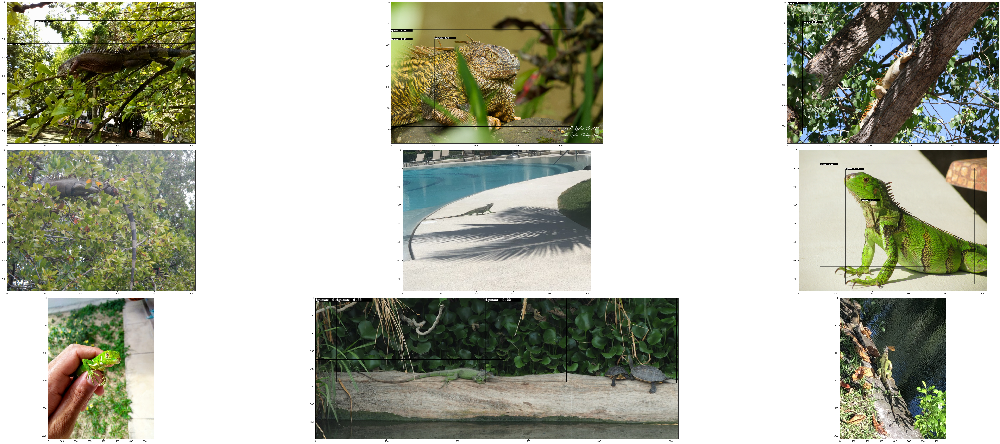

In [58]:
# Visualizing the sample images.
OUTPUT_PATH = 'yolo_infer_images' # relative path from $USER_EXPERIMENT_DIR.
COLS = 3 # number of columns in the visualizer grid.
IMAGES = 9 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)

## 10. Model Export <a class="anchor" id="head-10"></a>

If you trained a non-QAT model, you may export in FP32, FP16 or INT8 mode using the code block below. For INT8, you need to provide calibration image directory.

In [ ]:
# tlt-export will fail if .etlt already exists. So we clear the export folder before tlt-export
!rm -rf $LOCAL_EXPERIMENT_DIR/export
!mkdir -p $LOCAL_EXPERIMENT_DIR/export
# Export in FP32 mode. Change --data_type to fp16 for FP16 mode
!tlt yolo_v4 export -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/yolov4_mobilenet_v2_epoch_$EPOCH.tlt \
                    -k $KEY \
                    -o $USER_EXPERIMENT_DIR/export/yolov4_mobilenet_v2_epoch_$EPOCH.etlt \
                    -e $SPECS_DIR/yolo_v4_retrain_mobilenet_v2_kitti.txt \
                    --batch_size 16 \
                    --data_type fp16

# Uncomment to export in INT8 mode (generate calibration cache file). 
# !tlt yolo_v4 export -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/yolov4_mobilenet_v2_epoch_$EPOCH.tlt  \
#                     -o $USER_EXPERIMENT_DIR/export/yolov4_mobilenet_v2_epoch_$EPOCH.etlt \
#                     -e $SPECS_DIR/yolo_v4_retrain_mobilenet_v2_kitti.txt \
#                     -k $KEY \
#                     --cal_image_dir  $USER_EXPERIMENT_DIR/data/testing/image_2 \
#                     --data_type int8 \
#                     --batch_size 16 \
#                     --batches 10 \
#                     --cal_cache_file $USER_EXPERIMENT_DIR/export/cal.bin  \
#                     --cal_data_file $USER_EXPERIMENT_DIR/export/cal.tensorfile

2021-06-17 04:07:14,529 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the ~/.tlt_mounts.json file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.


In [ ]:
print('Exported model:')
print('------------')
!ls -lh $LOCAL_EXPERIMENT_DIR/export